In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import seaborn as sns

In [2]:
df= pd.read_csv('./Resources/Churn_Modelling_2.csv')
df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [3]:
new_df = df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)
new_df.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [4]:
df_fn = new_df[new_df.CreditScore !=850]
df_fn

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [5]:
corelation_matrix = df_fn.corr()
round(corelation_matrix,2)

C:\Users\jilld\AppData\Local\Temp\ipykernel_10992\2348695938.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corelation_matrix = df_fn.corr()


,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
CreditScore,1.00,-0.00,0.00,0.00,0.01,-0.01,0.02,0.00,-0.03
Age,-0.00,1.00,-0.01,0.03,-0.03,-0.01,0.09,-0.01,0.28
Tenure,0.00,-0.01,1.00,-0.01,0.02,0.02,-0.03,0.01,-0.02
Balance,0.00,0.03,-0.01,1.00,-0.30,-0.01,-0.01,0.01,0.12
NumOfProducts,0.01,-0.03,0.02,-0.30,1.00,0.00,0.01,0.02,-0.05
HasCrCard,-0.01,-0.01,0.02,-0.01,0.00,1.00,-0.01,-0.01,-0.01
IsActiveMember,0.02,0.09,-0.03,-0.01,0.01,-0.01,1.00,-0.01,-0.15
EstimatedSalary,0.00,-0.01,0.01,0.01,0.02,-0.01,-0.01,1.00,0.01
Exited,-0.03,0.28,-0.02,0.12,-0.05,-0.01,-0.15,0.01,1.00


<AxesSubplot: >

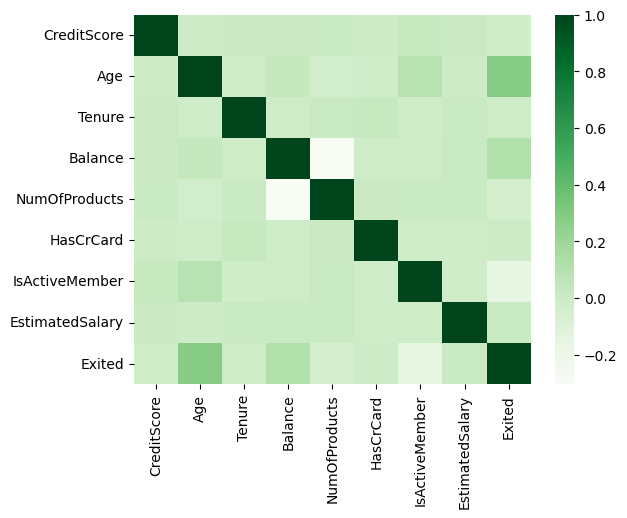

In [6]:
sns.heatmap(corelation_matrix, cmap="Greens")

### SMOTEENN Resampling

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
from pathlib import Path
from collections import Counter

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from imblearn.metrics import classification_report_imbalanced
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [9]:
#Create Features
X = pd.get_dummies(df_fn, columns=['Geography', 'Gender'])
X = X.drop(["Exited"], axis=1)

# Create our target
y = df_fn["Exited"]

In [10]:
# Check the balance of our target values
y.value_counts()

0    7773
1    1994
Name: Exited, dtype: int64

In [42]:
y_df=y.to_frame(name='Exited')
y_df=y_df.replace({'Exited': {0: 'Active', 1: 'Exited'}})

In [43]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
Counter(y_train)

Counter({0: 5809, 1: 1516})

In [44]:
# Standardize the data with StandardScaler().
scaler = StandardScaler().fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [45]:
# Combined over and under sampling for imbalanced classification
from imblearn.combine import SMOTEENN

# define sampling
comb_sample = SMOTEENN(random_state=1)
X_resample, y_resample = comb_sample.fit_resample(X_train, y_train)

# Check if SMOTE-ENN were properly applied
Counter(y_resample)

Counter({0: 3855, 1: 4891})

### Balanced RFC Model

In [46]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.datasets import make_classification

# Initiate the model
smoteenn_brfc = BalancedRandomForestClassifier(n_estimators=100, random_state=1)

# Fit the model
smoteenn_brfc_model = smoteenn_brfc.fit(X_resample, y_resample.ravel())

# Make Predictions
y_pred = smoteenn_brfc_model.predict(X_test)

In [47]:
# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=["Actual Active", "Actual Exited"], columns=["Predicted Active", "Predicted Exited"])
cm_df

,Predicted Active,Predicted Exited
Actual Active,1625,339
Actual Exited,149,329


In [48]:
# Print the balanced accuracy score 
print(f'smoteenn_brfc_accuracy')
print(balanced_accuracy_score(y_test, y_pred))

# Print the imbalanced classification report
from imblearn.metrics import classification_report_imbalanced
print(f'smoteenn rfc classification report')
print(classification_report_imbalanced(y_test, y_pred))

smoteenn_brfc_accuracy
0.7578387970924336
smoteenn rfc classification report
                   pre       rec       spe        f1       geo       iba       sup

          0       0.92      0.83      0.69      0.87      0.75      0.58      1964
          1       0.49      0.69      0.83      0.57      0.75      0.56       478

avg / total       0.83      0.80      0.72      0.81      0.75      0.57      2442



In [49]:
# List the features sorted in descending order by feature importance
importances = smoteenn_brfc_model.feature_importances_

# Display feature importance as a DataFrame
importance_df = pd.DataFrame({'feature': X.columns, 'importance': importances}).sort_values(by='importance', ascending=False)
importance_df.head(10)

,feature,importance
1,Age,0.283372
4,NumOfProducts,0.231159
3,Balance,0.114814
0,CreditScore,0.071827
7,EstimatedSalary,0.069083
2,Tenure,0.064159
6,IsActiveMember,0.053892
9,Geography_Germany,0.042598
8,Geography_France,0.014737
5,HasCrCard,0.014654


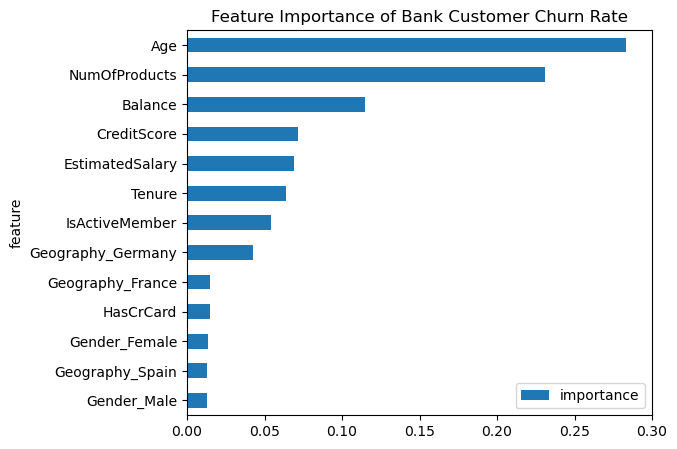

In [50]:
# Plot feature importances
fig = importance_df.sort_values(by='importance', ascending=True)\
  .plot.barh(x='feature', y='importance', title="Feature Importance of Bank Customer Churn Rate", xlim=(0, 0.30), figsize=(6, 5)).get_figure()


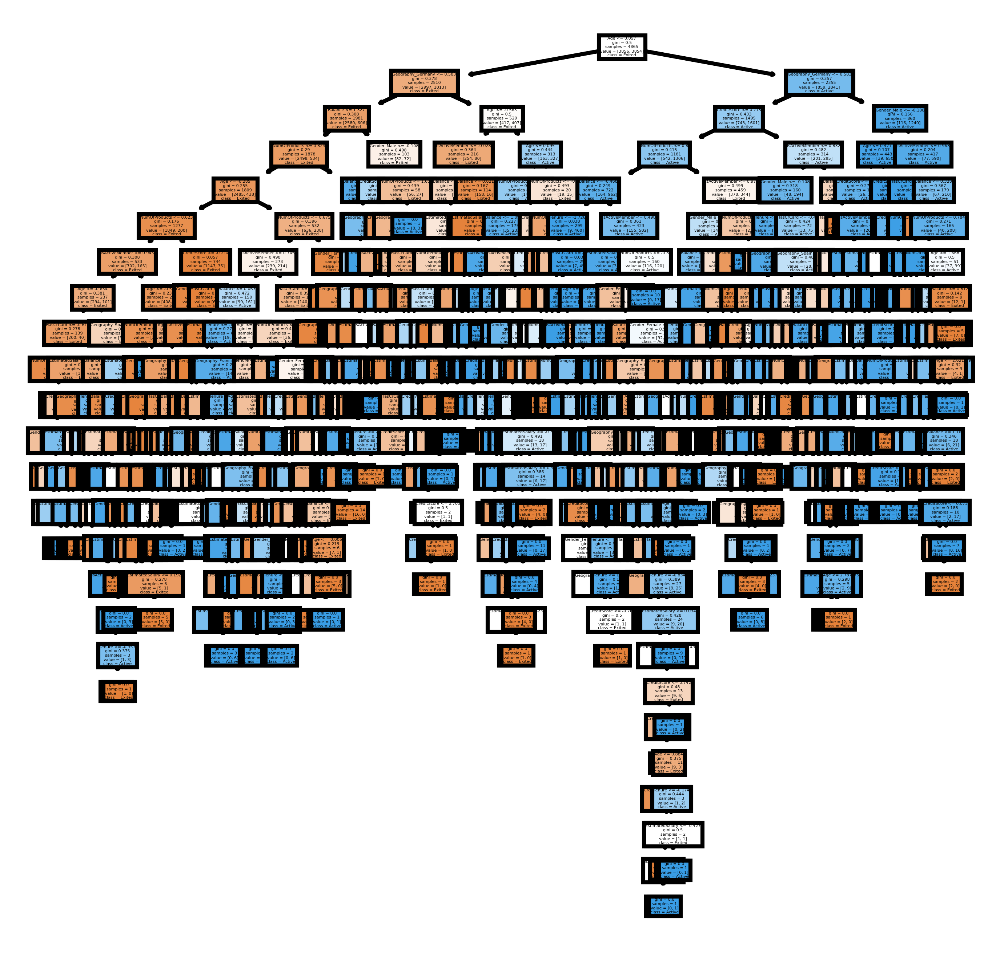

In [51]:
from sklearn import tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(smoteenn_brfc.estimators_[10],
               feature_names = X.columns, 
               class_names= y_df['Exited'],
               filled = True);
fig.savefig('brfc_individualtree.png')

In [56]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(smoteenn_brfc.estimators_[index],
                   feature_names = X.columns, 
                   class_names= y_df['Exited'],
                   filled = True,
                   ax = axes[index]);
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('brfc_5trees.png')

In [53]:
from sklearn.tree import export_graphviz
import six
import pydot

# Extract single tree
estimator = smoteenn_brfc_model.estimators_[10]

# Export as dot file
export_graphviz(estimator,
                out_file='tree.dot',
                feature_names = X.columns,
                class_names =y_df['Exited'],
                rounded = True, proportion = False,
                precision = 2, filled = True)